# Introduction

## image vs video classifier important differences

## Below is a video of a ball moving up and down at an angel on a pice of paper

![bounceUrl](https://i.pinimg.com/originals/51/a1/78/51a178db896cef07ea79b2075aacb457.gif "bounce")
# if we were to take a snap shot (an image) of the ball at a certain point in time it would be extremlly hard (quite frankly impossible) for a classifier model to dertermine weather the ball is moving up or down
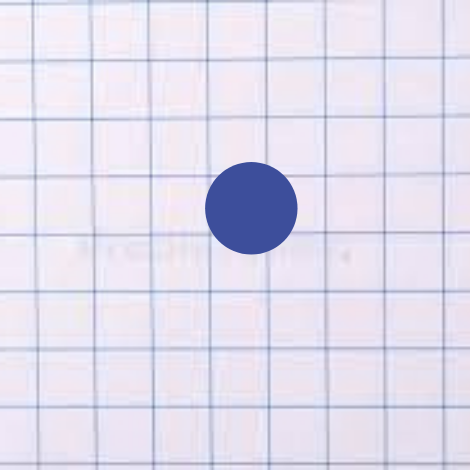

# How ever if we can combine a series of snapshots (that occur one after the other) we would much more likely be able to predict if the ball hence is moving upwards or downwards

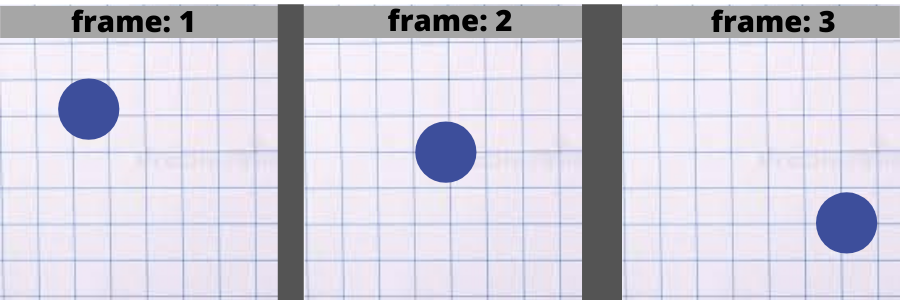


## The same can be said for our hands classifieer, to take a frame in time ( a snapshot) of two peoples hands will not paint an accurate picture. Ofcourse both hands might be closed at the same time when syncronized more than the times members acted spontanuasly and our model could still do pretty well but from here on out we shall define a video as follows:

# A video is a series of frames (images) organized in the order they were taken

# importing files, spliting in to Alone, sync and spont lists of files

In [1]:
import os
import pandas as pd
from pandas import Series
import numpy as np
import matplotlib.pyplot as plt

path_training_ec = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Training\Evyatar Cohen'
path_training_ns = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Training\Nofar Social_Nuero'
path_training_os = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Training\Oriya Social_Nuero'
path_training_ok = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Training\Orya Kalmanovitz'
path_training_rm = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Training\Revital Marbel'
path_training_st = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Training\Shahar Terner'
path_training_ss = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Training\Shelly Social_Nuero'
path_training_yh = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Training\Yael Hagai'
path_training_yr = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Training\Yoel Raz'

lst = [path_training_ec,
path_training_ns,
path_training_os,
path_training_ok,
path_training_rm,
path_training_st,
path_training_ss,
path_training_yh,
path_training_yr]

#creating alone, sync and spontan lists of files

aloneFiles = []
syncFiles = []
spontanFiles = []

for l in lst:
    path = l
    dirListing = os.listdir(path)
   
    for item in dirListing:
        if 'Alone' in item:
            aloneFiles.append(path +'\\'+item)
        if 'Sync' in item:
            syncFiles.append(path +'\\'+item)
        if 'Spontan' in item:
            spontanFiles.append(path +'\\'+item)
print(len(aloneFiles))
print(len(syncFiles))
print(len(spontanFiles))

9
9
9


# merging right hand and alone files

In [2]:
path = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\HandRight.csv'
righthand = pd.read_csv(path)

In [3]:
righthand[" Hand Type"] = Series([1 if i == "right" else 2 for i in righthand[" Hand Type"]])
righthand.insert(loc = 0, column = 'label', value = "1")
righthand= righthand.reset_index(drop = True)
righthand= righthand.drop(' Frame ID',axis = 1)

In [4]:
updated_alonefiles = []
for file in aloneFiles:
        f = pd.read_csv(file)
        
        f[" Hand Type"] = Series([1 if i == "right" else 2 for i in f[" Hand Type"]]) 
        f.insert(loc=0, column = 'label', value = "1")
        f = f.drop(' Frame ID',axis = 1)
        f = f.reset_index(drop = True)
        righthand = righthand[0:f.shape[0]]
        f = pd.merge(f, righthand, left_index = True, right_index = True)
        print(f.shape)
        updated_alonefiles.append(f)    

(4526, 44)
(4526, 44)
(4482, 44)
(4482, 44)
(4482, 44)
(4482, 44)
(4468, 44)
(4468, 44)
(2250, 44)


In [5]:

alone_cropped = []
for file in updated_alonefiles:
    alone_cropped.append(file[0:file.shape[0]-98])


In [6]:
for file in alone_cropped:
    print(file.isnull().sum().max())

0
0
0
0
0
0
0
0
0


# drop first 7 secs, and two feautres

In [7]:
for file in alone_cropped:
    file.drop([' Hand Type_y',' Hand Type_x'], inplace = True,axis = 1)
    file = file.iloc[65*7:]

c:\users\joshua student\appdata\local\programs\python\python39\lib\site-packages\pandas\core\frame.py:4901: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [8]:
alone_cropped[0].head()

,label_x,Time_x,# hands_x,Position X_x,Position Y_x,Position Z_x,Velocity X_x,Velocity Y_x,Velocity Z_x,Pitch_x,...,Yaw_y,Wrist Pos X_y,Wrist Pos Y_y,Wrist Pos Z_y,Elbow pos X_y,Elbow Pos Y_y,Elbow Pos Z_y,Grab Strenth_y,Grab Angle_y,Pinch Strength_y
0,1,518.8087,1,-97.60160,164.1213,42.81255,104.2589,-491.6730,-55.42755,2.939312,...,-0.277800,46.88831,207.3548,86.23589,203.8337,49.33507,237.4553,0.0,0.206389,0.0
1,1,518.8252,1,-95.78062,157.6353,42.18084,148.9683,-351.7386,-36.32422,2.294397,...,-0.277763,47.54861,205.6568,86.42250,203.9553,47.88272,238.4482,0.0,0.243050,0.0
2,1,518.8418,1,-94.39360,154.6338,41.93171,161.6958,-349.9117,-29.04277,1.962658,...,-0.278792,48.15030,204.5182,86.35149,204.6231,45.35921,236.8544,0.0,0.281134,0.0
3,1,518.8587,1,-92.02553,150.6723,42.10119,117.3475,-187.1781,24.42598,1.545560,...,-0.279768,48.64175,203.9989,86.16056,204.9939,44.18692,236.0927,0.0,0.277691,0.0
4,1,518.8749,1,-89.31953,148.1826,42.67065,155.3344,-135.6337,35.87055,1.377898,...,-0.278629,48.93135,203.3777,85.59017,204.5952,42.68003,235.2896,0.0,0.283008,0.0


# same for sync files and spon files

In [9]:
########################################
#sync files

In [10]:
syncfiles_updated = []

for file in syncFiles:
    hand = pd.read_csv(file)
    hand = hand.iloc[65*7*2:]
    df_right = hand[hand[' Hand Type'] == 'right']
    df_left = hand[hand[' Hand Type'] == 'left']

    df_right[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_right[" Hand Type"]])
    df_right.insert(loc = 0, column = 'label', value = "2")
    df_right= df_right.reset_index(drop = True)
    df_right= df_right.drop(' Frame ID',axis = 1)

    df_left[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_left[" Hand Type"]]) 
    df_left.insert(loc=0, column = 'label', value = "2")
    df_left = df_left.drop(' Frame ID',axis = 1)
    df_left = df_left.reset_index(drop = True)
    df_merged = pd.merge(df_right, df_left, left_index = True, right_index = True)
    syncfiles_updated.append(df_merged)

C:\Users\JOSHUA~1\AppData\Local\Temp/ipykernel_8588/732058032.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_right[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_right[" Hand Type"]])
C:\Users\JOSHUA~1\AppData\Local\Temp/ipykernel_8588/732058032.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_left[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_left[" Hand Type"]])


In [11]:
for file in syncfiles_updated:
    file.drop([' Hand Type_y',' Hand Type_x'], inplace = True,axis = 1)

In [12]:
for file in syncfiles_updated:
    print(file.isnull().sum().max())

0
0
0
0
0
0
0
0
0


In [13]:
#####################################################
#spontan files

In [14]:
spontanfiles_updated = []

for file in spontanFiles:
    hand = pd.read_csv(file)
    hand = hand.iloc[65*7*2:]
    df_right = hand[hand[' Hand Type'] == 'right']
    df_left = hand[hand[' Hand Type'] == 'left']

    df_right[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_right[" Hand Type"]])
    df_right.insert(loc = 0, column = 'label', value = "3")
    df_right= df_right.reset_index(drop = True)
    df_right= df_right.drop(' Frame ID',axis = 1)

    df_left[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_left[" Hand Type"]]) 
    df_left.insert(loc=0, column = 'label', value = "3")
    df_left = df_left.drop(' Frame ID',axis = 1)
    df_left = df_left.reset_index(drop = True)
    df_merged = pd.merge(df_right, df_left, left_index = True, right_index = True)
    spontanfiles_updated.append(df_merged)

C:\Users\JOSHUA~1\AppData\Local\Temp/ipykernel_8588/3397197463.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_right[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_right[" Hand Type"]])
C:\Users\JOSHUA~1\AppData\Local\Temp/ipykernel_8588/3397197463.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_left[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_left[" Hand Type"]])


In [15]:
for file in spontanfiles_updated:
    file.drop([' Hand Type_y',' Hand Type_x'], inplace = True,axis = 1)

In [16]:
for file in spontanfiles_updated:
    print(file.isnull().sum().max())

0
0
0
0
0
0
0
0
0


# We shall reduce each file by taking every 8th frame as human movements are slow there is not such a diffrance between each frame

In [17]:
# reduce

In [18]:
divide_by = 8
fps = 10

In [19]:
alone_cropped_reduced = []
for file in alone_cropped:
    base_reduced = pd.DataFrame(file.iloc[0]).transpose()
    for i in range(divide_by, file.shape[0], divide_by):
        temp = pd.DataFrame(file.iloc[i]).transpose()
        base_reduced = base_reduced.append(temp)
    alone_cropped_reduced.append(base_reduced)

In [20]:
syncfiles_updated_reduced = []
for file in syncfiles_updated:
    base_reduced = pd.DataFrame(file.iloc[0]).transpose()
    for i in range(divide_by, file.shape[0], divide_by):
        temp = pd.DataFrame(file.iloc[i]).transpose()
        base_reduced = base_reduced.append(temp)
    syncfiles_updated_reduced.append(base_reduced)

In [21]:
spontanfiles_updated_reduced = []
for file in spontanfiles_updated:
    base_reduced = pd.DataFrame(file.iloc[0]).transpose()
    for i in range(divide_by, file.shape[0], divide_by):
        temp = pd.DataFrame(file.iloc[i]).transpose()
        base_reduced = base_reduced.append(temp)
    spontanfiles_updated_reduced.append(base_reduced)

# important! 
# as stated at the begging we want a video classiffier and not a img classifier.
# therefor we shall add 10 reduced frames in to one row
# each row will represent roughly 1 second of the "video" in our case hands 

In [22]:
##############################################
#pic to vid

In [23]:
cols = list(range(36*fps))

In [24]:
alone_cropped_reduced_final = []
for alone in alone_cropped_reduced:
    alone.drop(['label_y','Time_y',' # hands_y'], inplace = True, axis = 1 )
    add_from_df = alone.iloc[:,3:]
    add_from_df = add_from_df.reset_index(drop=True)
    
    lst_from = add_from_df.values.tolist()
    df = pd.DataFrame(columns = cols)
    
    n = lst_from[0] + lst_from[1]+ lst_from[2]+ lst_from[3]+ lst_from[4]+ lst_from[5]+ lst_from[6]+ lst_from[7]+ lst_from[8]+ lst_from[9] 
    tmp = pd.DataFrame(n).T
    df.append(tmp)
    
    r = len(lst_from) % fps
    
    for i in range(r):
        lst_from.pop()
    for j in range(fps, len(lst_from),fps):
        n = lst_from[0+j] + lst_from[1+j]+ lst_from[2+j]+ lst_from[3+j]+ lst_from[4+j]+ lst_from[5+j]+ lst_from[6+j]+ lst_from[7+j]+ lst_from[8+j]+ lst_from[9+j]
        tmp = pd.DataFrame(n).T
        df = df.append(tmp)
    alone_cropped_reduced_final.append(df)

In [25]:
syncfiles_updated_reduced_final = []
for sync in syncfiles_updated_reduced:
    sync.drop(['label_y','Time_y',' # hands_y'], inplace = True, axis = 1 )
    add_from_df = sync.iloc[:,3:]
    add_from_df = add_from_df.reset_index(drop=True)
    
    lst_from = add_from_df.values.tolist()
    df = pd.DataFrame(columns = cols)
    
    n = lst_from[0] + lst_from[1]+ lst_from[2]+ lst_from[3]+ lst_from[4]+ lst_from[5]+ lst_from[6]+ lst_from[7]+ lst_from[8]+ lst_from[9] 
    tmp = pd.DataFrame(n).T
    df.append(tmp)
    
    r = len(lst_from) % fps
    
    for i in range(r):
        lst_from.pop()
    for j in range(fps, len(lst_from),fps):
        n = lst_from[0+j] + lst_from[1+j]+ lst_from[2+j]+ lst_from[3+j]+ lst_from[4+j]+ lst_from[5+j]+ lst_from[6+j]+ lst_from[7+j]+ lst_from[8+j]+ lst_from[9+j]
        tmp = pd.DataFrame(n).T
        df = df.append(tmp)
    syncfiles_updated_reduced_final.append(df)

In [26]:
spontanfiles_updated_reduced_final = []
for spon in spontanfiles_updated_reduced:
    spon.drop(['label_y','Time_y',' # hands_y'], inplace = True, axis = 1 )
    add_from_df = spon.iloc[:,3:]
    add_from_df = add_from_df.reset_index(drop=True)
    
    lst_from = add_from_df.values.tolist()
    df = pd.DataFrame(columns = cols)
    
    n = lst_from[0] + lst_from[1]+ lst_from[2]+ lst_from[3]+ lst_from[4]+ lst_from[5]+ lst_from[6]+ lst_from[7]+ lst_from[8]+ lst_from[9] 
    tmp = pd.DataFrame(n).T
    df.append(tmp)
    
    r = len(lst_from) % fps
    
    for i in range(r):
        lst_from.pop()
    for j in range(fps, len(lst_from),fps):
        n = lst_from[0+j] + lst_from[1+j]+ lst_from[2+j]+ lst_from[3+j]+ lst_from[4+j]+ lst_from[5+j]+ lst_from[6+j]+ lst_from[7+j]+ lst_from[8+j]+ lst_from[9+j]
        tmp = pd.DataFrame(n).T
        df = df.append(tmp)
    spontanfiles_updated_reduced_final.append(df)

# add labels 1 = alone, 2 = sync , 3 = spont

In [27]:
for file in alone_cropped_reduced_final:
    file.insert(loc=0, column = 'label', value = "1")

In [28]:
for file in syncfiles_updated_reduced_final:
    file.insert(loc=0, column = 'label', value = "2")

In [29]:
for file in spontanfiles_updated_reduced_final:
    file.insert(loc=0, column = 'label', value = "3")

# merge all datasets

In [30]:
df_base = alone_cropped_reduced_final[0]
for i in range(1,len(alone_cropped_reduced_final)):
    df_base = df_base.append(alone_cropped_reduced_final[i])
for file in syncfiles_updated_reduced_final:
    df_base = df_base.append(file)
for file in spontanfiles_updated_reduced_final:
    df_base = df_base.append(file)

In [31]:
df_base

,label,0,1,2,3,4,5,6,7,8,...,350,351,352,353,354,355,356,357,358,359
0,1,-59.35698,265.2628,68.863480,59.53638,-235.20470,88.558650,2.092821,0.846608,2.103144,...,-0.221066,44.785000,221.7660,51.56184,188.4485,64.232930,217.3751,0.000000,0.352648,0.000000
0,1,-83.10691,206.3420,12.135430,19.85891,106.07480,141.990000,0.968628,0.844828,0.710232,...,-0.179805,3.822185,237.3751,60.04918,156.3771,83.525080,222.1171,0.000000,0.107162,0.000000
0,1,-60.45441,186.9819,66.639120,-355.66750,-31.88013,58.297050,0.593406,-1.466941,1.238650,...,-0.213198,34.565620,173.1132,72.20874,188.6181,45.998180,255.1373,0.000000,0.427245,0.000000
0,1,-70.56304,222.2451,44.073710,-140.11540,18.36955,-41.182440,0.797651,-0.903004,1.371628,...,-0.994574,60.278850,289.3318,49.89313,265.0580,194.777100,197.5843,0.000000,0.033952,0.000000
0,1,-104.62200,230.5061,44.932910,69.84379,-29.68425,-151.555100,1.374446,0.249164,1.512519,...,-0.791867,55.610110,236.9278,35.33736,235.9943,139.404200,210.0705,0.000000,0.104399,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,3,151.34630,252.8158,34.656090,-158.84010,-251.96200,-1.622345,1.237679,-0.590919,-0.913520,...,0.760334,-154.933200,172.9507,89.83109,-373.0961,32.029030,117.7780,0.000000,2.554668,0.723541
0,3,176.67430,345.7329,50.441710,167.17770,143.86540,41.979580,1.358017,-0.965312,-1.205045,...,0.704640,-124.882900,151.7345,57.34357,-307.6486,-7.893136,153.7407,0.122139,1.197612,0.000000
0,3,204.57660,280.9209,103.872200,-294.11350,-217.07390,-289.493400,1.504329,-1.209542,-1.380102,...,1.078812,-135.505200,164.5318,107.73510,-376.3997,68.836090,132.6106,0.000000,0.000000,0.000000
0,3,189.27960,260.3031,82.183470,-307.35890,-404.72520,-335.909600,1.246572,-1.030895,-0.916717,...,-1.901687,-120.808200,155.9109,36.96514,-259.0559,-52.271500,107.6544,0.000000,0.000000,0.000000


In [32]:
df_base.isnull().sum()

label    0
0        0
1        0
2        0
3        0
        ..
355      0
356      0
357      0
358      0
359      0
Length: 361, dtype: int64

# lets analize the std, and mu of each feature and see what our model might have a better chance predicting

In [44]:
df1 = df_base.loc[df_base['label'] == '1']
df2 = df_base.loc[df_base['label'] == '2']
df3 = df_base.loc[df_base['label'] == '3']

# we can see below around a tenth of a second representing a frame
# we can see that sync and spon are much more similar and therefor our model should have more toruble deciding between sync and spon 
# we can see our modle should predict alone very well

C:\Users\JOSHUA~1\AppData\Local\Temp/ipykernel_8588/1088866768.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(13,8))


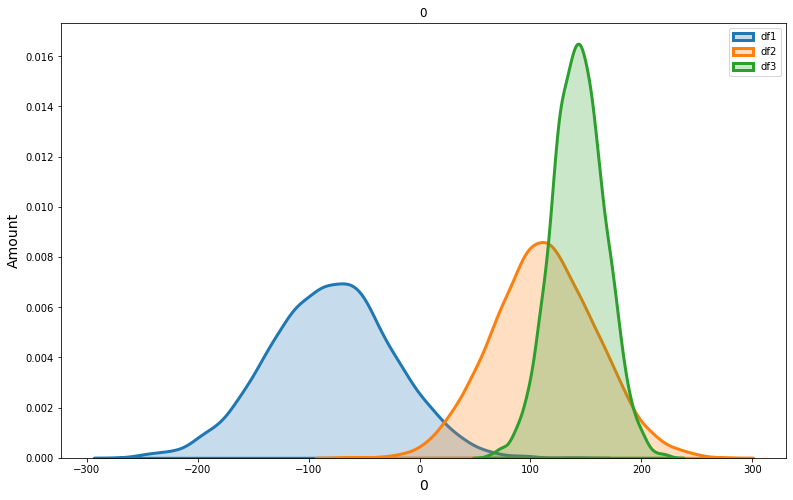

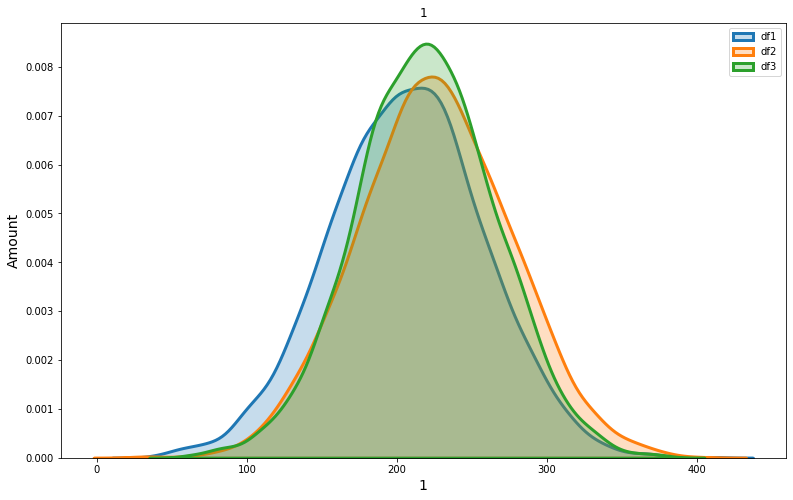

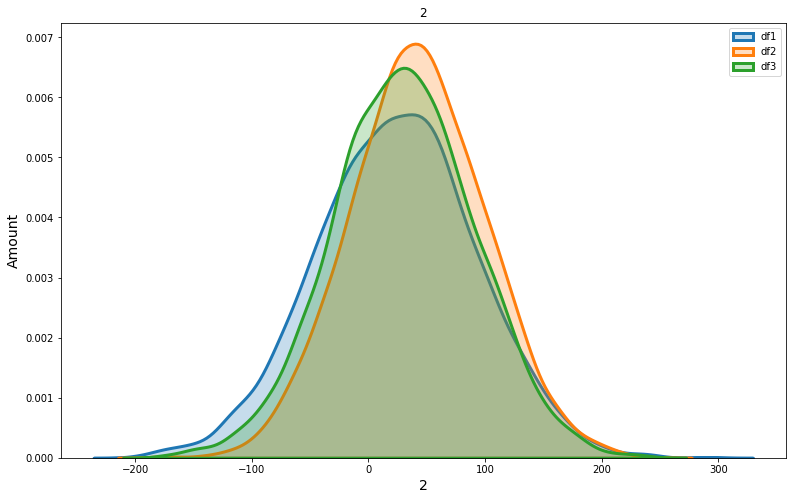

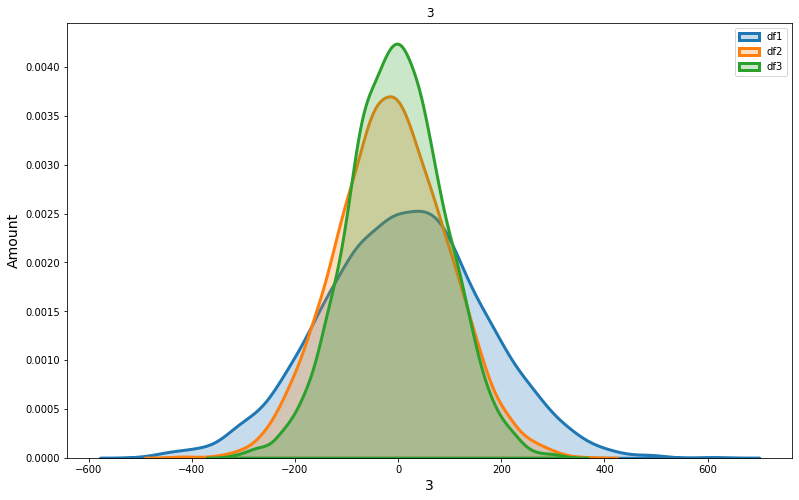

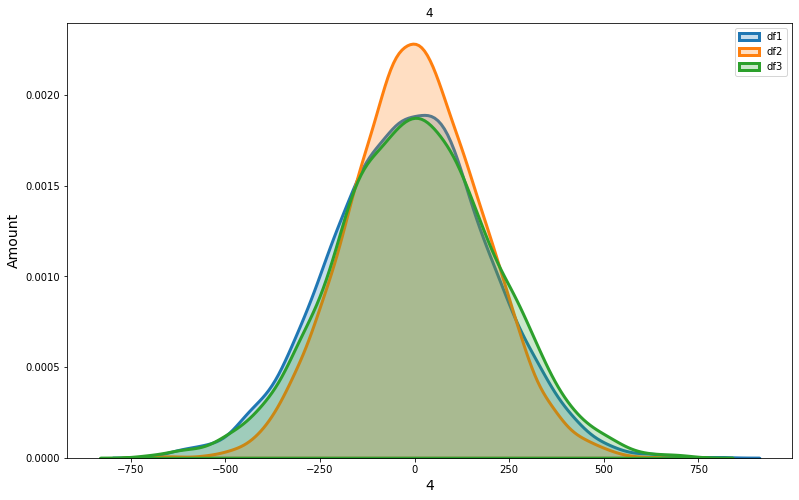

...

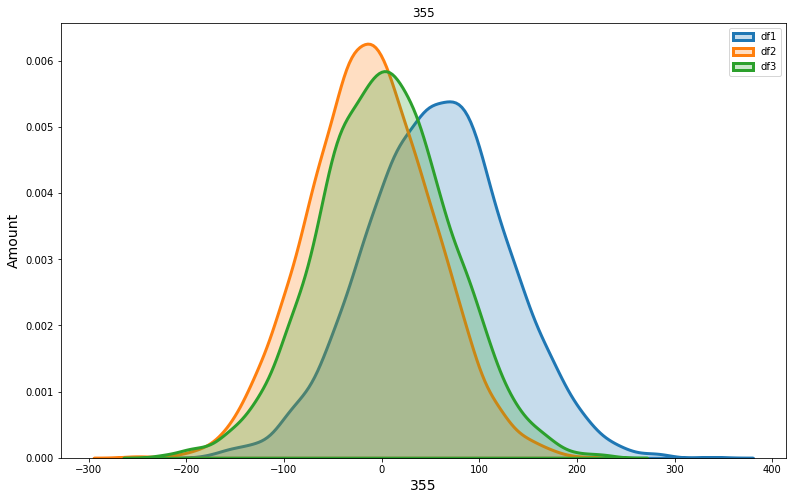

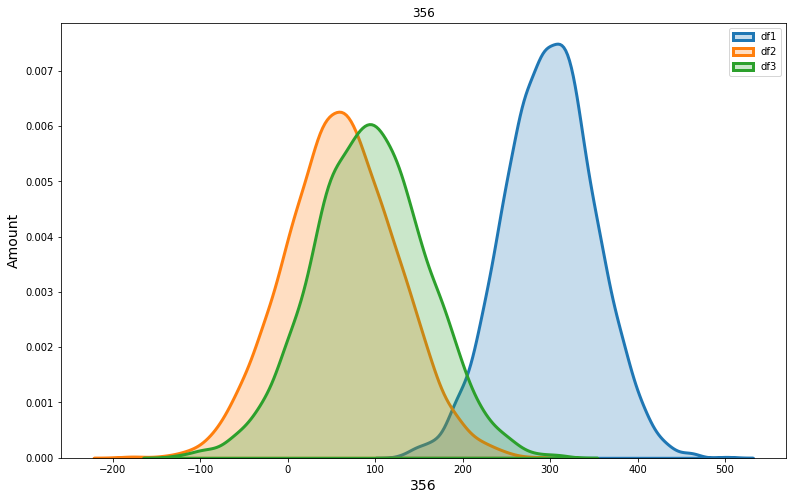

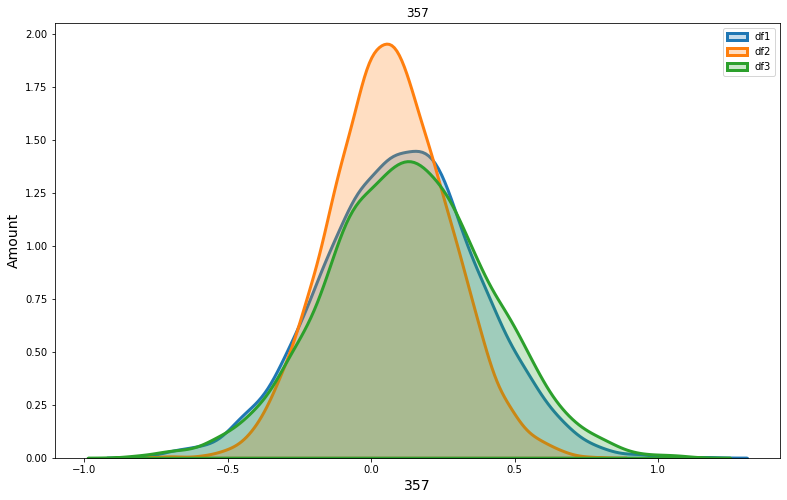

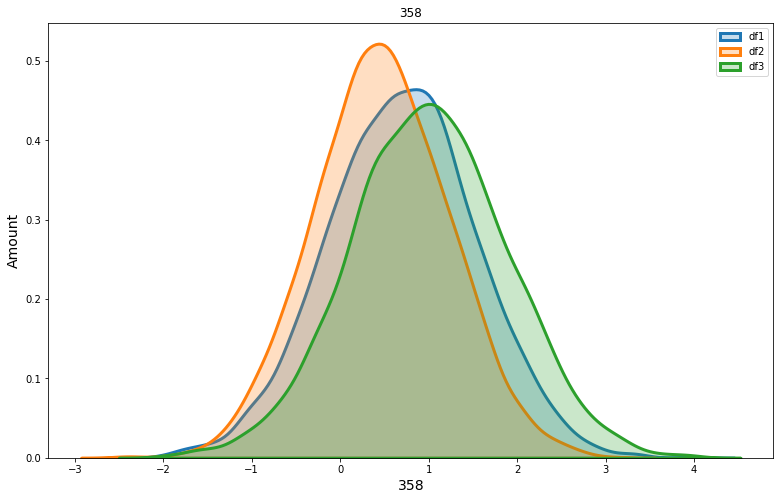

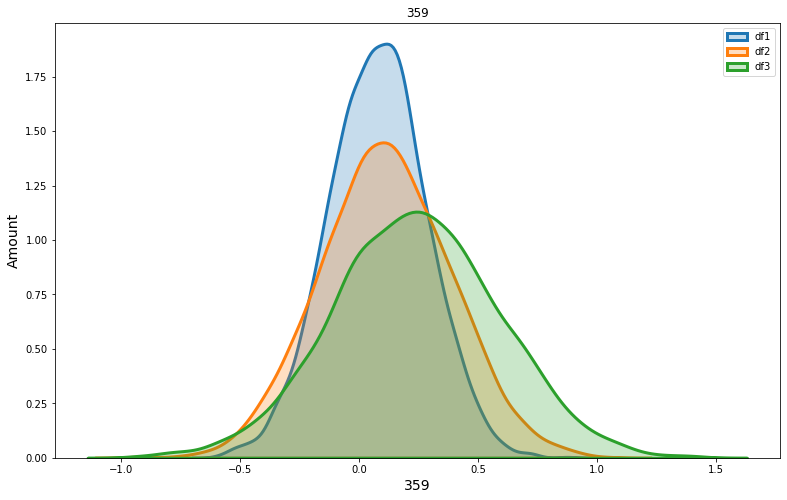

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

def histogram(lst_features):
    for f in lst_features:

        # set seed for reproducing
        np.random.seed(42)
        n = 5000
        
        #df1
        mean_df1 = df1[f].mean()
        sd_df1 = df1[f].std()
        hist_df1 = np.random.normal(mean_df1, sd_df1, n)


        #df2
        mean_df2 = df2[f].mean()
        sd_df2 = df2[f].std()
        hist_df2 = np.random.normal(mean_df2, sd_df2, n)

        #df3
        mean_df3 = df3[f].mean()
        sd_df3 = df3[f].std()
        hist_df3 = np.random.normal(mean_df3, sd_df3, n)

        plt.figure(figsize=(13,8))
        sns.distplot(hist_df1, hist = False, kde = True,kde_kws = {'shade': True, 'linewidth': 3}, label = "df1")
        sns.distplot(hist_df2, hist = False, kde = True,kde_kws = {'shade': True, 'linewidth': 3}, label = "df2")
        sns.distplot(hist_df3, hist = False, kde = True,kde_kws = {'shade': True, 'linewidth': 3}, label = "df3")

        plt.xlabel(f, size=14)
        plt.ylabel("Amount", size=14)
        plt.title(f)
        plt.legend(loc='upper right')

        
lst_fs = list(df2)
lst_fs.remove('label')


histogram(lst_fs)

In [46]:
# continue

# we now have approximatly 10 frames per second each frame represents a snap shot of the hands in time as mentioned at the beggning we want our model
# to evaluate our dataset as videos rather than imgs therefor we have made each sample (row) a combanation of 10 reduced frames representing 1 second

In [47]:
from sklearn.utils import shuffle
df_base = shuffle(df_base)

In [48]:
# split labels and features

In [49]:
X=df_base.iloc[:,1:].values
y=df_base.iloc[:,0].values

In [50]:
# normalize

In [51]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [52]:
X = sc.fit_transform(X)

# show dummy classifier 
# we need to know if our model is worth anything, this is a good way to check
# our model needs to beat the benchmark set by a dummy classifier

In [55]:
from sklearn.dummy import DummyClassifier

dummy_clf = DummyClassifier(strategy='most_frequent')
dummy_clf.fit(X, y)
DummyClassifier(strategy='most_frequent')

dummy_clf.score(X, y)

0.3576526566217288

# make knn and xgboost model

In [57]:
from sklearn.neighbors import KNeighborsClassifier
clf = KNeighborsClassifier(n_neighbors=5)
clf.fit(X,y)

KNeighborsClassifier()

In [58]:
import warnings
warnings.filterwarnings('ignore')
from xgboost import XGBClassifier

xgb = XGBClassifier(learning_rate = 0.2, n_estimators = 2000)
xgb.fit(X, y)

[06:31:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.2, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=2000, n_jobs=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

# make changeds to testing data like we did to testing data

# testing

In [59]:
path_validation_ll = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Validation\Itiel Lab'
path_validation_ms = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Validation\Mor SHerman'
path_validation_om = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\Validation\Oded Medina'

lst_val = [path_validation_ll,
path_validation_ms,
path_validation_om]

#creating alone, sync and spontan lists of files

aloneFiles_val = []
syncFiles_val = []
spontanFiles_val = []

for l in lst_val:
    path = l
    dirListing = os.listdir(path)
   
    for item in dirListing:
        if 'Alone' in item:
            aloneFiles_val.append(path +'\\'+item)
        if 'Sync' in item:
            syncFiles_val.append(path +'\\'+item)
        if 'Spontan' in item:
            spontanFiles_val.append(path +'\\'+item)
print(len(aloneFiles_val))
print(len(syncFiles_val))
print(len(spontanFiles_val))

3
3
3


In [60]:
#merging right hand and left in alone files

In [61]:
path = r'C:\Users\Joshua Student\Downloads\Hand Positions\extraFiles\HandRight.csv'
righthand = pd.read_csv(path)
righthand.shape
righthand.head()

,Time,Frame ID,Hand Type,# hands,Position X,Position Y,Position Z,Velocity X,Velocity Y,Velocity Z,...,Yaw,Wrist Pos X,Wrist Pos Y,Wrist Pos Z,Elbow pos X,Elbow Pos Y,Elbow Pos Z,Grab Strenth,Grab Angle,Pinch Strength
0,128.2883,15478,right,1,15.67167,226.2064,20.26470,34.26665,-195.214700,-35.043020,...,-0.277800,46.88831,207.3548,86.23589,203.8337,49.33507,237.4553,0.0,0.206389,0.0
1,128.3048,15480,right,1,16.24119,222.9389,20.11781,36.16443,-180.093900,-4.052799,...,-0.277763,47.54861,205.6568,86.42250,203.9553,47.88272,238.4482,0.0,0.243050,0.0
2,128.3218,15482,right,1,16.72461,220.9709,19.94972,26.35298,-95.088190,-11.157620,...,-0.278792,48.15030,204.5182,86.35149,204.6231,45.35921,236.8544,0.0,0.281134,0.0
3,128.3384,15484,right,1,17.09016,219.7124,19.67679,19.46804,-61.755180,-21.303780,...,-0.279768,48.64175,203.9989,86.16056,204.9939,44.18692,236.0927,0.0,0.277691,0.0
4,128.3551,15486,right,1,17.46017,219.3652,19.13128,21.94964,-8.355943,-35.081790,...,-0.278629,48.93135,203.3777,85.59017,204.5952,42.68003,235.2896,0.0,0.283008,0.0


In [62]:
righthand[" Hand Type"] = Series([1 if i == "right" else 2 for i in righthand[" Hand Type"]])
righthand.insert(loc = 0, column = 'label', value = "1")
righthand= righthand.reset_index(drop = True)
righthand= righthand.drop(' Frame ID',axis = 1)

In [63]:
updated_alonefiles_val = []
for file in aloneFiles_val:
        f = pd.read_csv(file)
        
        f[" Hand Type"] = Series([1 if i == "right" else 2 for i in f[" Hand Type"]]) 
        f.insert(loc=0, column = 'label', value = "1")
        f = f.drop(' Frame ID',axis = 1)
        f = f.reset_index(drop = True)
        righthand = righthand[0:f.shape[0]]
        f = pd.merge(f, righthand, left_index = True, right_index = True)
        print(f.shape)
        updated_alonefiles_val.append(f)    

(4700, 44)
(4614, 44)
(2250, 44)


In [64]:
updated_alonefiles_val_croped = []
for file in updated_alonefiles_val:
    updated_alonefiles_val_croped.append(file[0:file.shape[0]-272])


In [65]:
for file in updated_alonefiles_val_croped:
    print(file.isnull().sum().max())

0
0
0


In [66]:
for file in updated_alonefiles_val_croped:
    file.drop([' Hand Type_y',' Hand Type_x'], inplace = True,axis = 1)
    file = file.iloc[65*7:]

In [67]:
########################################
#sync files

In [69]:
syncfiles_updated_val = []

for file in syncFiles_val:
    hand = pd.read_csv(file)
    hand = hand.iloc[65*7*2:]
    df_right = hand[hand[' Hand Type'] == 'right']
    df_left = hand[hand[' Hand Type'] == 'left']

    df_right[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_right[" Hand Type"]])
    df_right.insert(loc = 0, column = 'label', value = "2")
    df_right= df_right.reset_index(drop = True)
    df_right= df_right.drop(' Frame ID',axis = 1)

    df_left[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_left[" Hand Type"]]) 
    df_left.insert(loc=0, column = 'label', value = "2")
    df_left = df_left.drop(' Frame ID',axis = 1)
    df_left = df_left.reset_index(drop = True)
    df_merged = pd.merge(df_right, df_left, left_index = True, right_index = True)
    syncfiles_updated_val.append(df_merged)

In [70]:
for file in syncfiles_updated_val:
    file.drop([' Hand Type_y',' Hand Type_x'], inplace = True,axis = 1)

In [71]:
for f in syncfiles_updated_val:
    print(f.isnull().sum().max())

0
0
0


In [72]:
#####################################################
#spontan files

In [73]:
spontanfiles_updated_val = []

for file in spontanFiles_val:
    hand = pd.read_csv(file)
    hand = hand.iloc[65*7*2:]
    df_right = hand[hand[' Hand Type'] == 'right']
    df_left = hand[hand[' Hand Type'] == 'left']

    df_right[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_right[" Hand Type"]])
    df_right.insert(loc = 0, column = 'label', value = "3")
    df_right= df_right.reset_index(drop = True)
    df_right= df_right.drop(' Frame ID',axis = 1)

    df_left[" Hand Type"] = Series([1 if i == "right" else 2 for i in df_left[" Hand Type"]]) 
    df_left.insert(loc=0, column = 'label', value = "3")
    df_left = df_left.drop(' Frame ID',axis = 1)
    df_left = df_left.reset_index(drop = True)
    df_merged = pd.merge(df_right, df_left, left_index = True, right_index = True)
    spontanfiles_updated_val.append(df_merged)

In [74]:
for file in spontanfiles_updated_val:
    file.drop([' Hand Type_y',' Hand Type_x'], inplace = True,axis = 1)

In [75]:
for f in spontanfiles_updated_val:
    print(f.isnull().sum().max())

0
0
0


In [76]:
############################################
#pic to video
divide_by = 8
fps = 10

In [77]:
alone_lst = []
for file in updated_alonefiles_val_croped:
    base_reduced = pd.DataFrame(file.iloc[0]).transpose()
    for i in range(divide_by, file.shape[0], divide_by):
        temp = pd.DataFrame(file.iloc[i]).transpose()
        base_reduced = base_reduced.append(temp)
    alone_lst.append(base_reduced)
sync_lst = []
for file in syncfiles_updated_val:
    base_reduced = pd.DataFrame(file.iloc[0]).transpose()
    for i in range(divide_by, file.shape[0], divide_by):
        temp = pd.DataFrame(file.iloc[i]).transpose()
        base_reduced = base_reduced.append(temp)
    sync_lst.append(base_reduced)
    
spon_lst = []
for file in spontanfiles_updated_val:
    base_reduced = pd.DataFrame(file.iloc[0]).transpose()
    for i in range(divide_by, file.shape[0], divide_by):
        temp = pd.DataFrame(file.iloc[i]).transpose()
        base_reduced = base_reduced.append(temp)
    spon_lst.append(base_reduced)

In [78]:
updated_alonefiles_val_croped = alone_lst
syncfiles_updated_val = sync_lst
spontanfiles_updated_val = spon_lst

In [79]:
cols = list(range(36*fps))

In [80]:
updated_alonefiles_val_croped_final = []
for alone in updated_alonefiles_val_croped:
    alone.drop(['label_y','Time_y',' # hands_y'], inplace = True, axis = 1 )
    add_from_df = alone.iloc[:,3:]
    add_from_df = add_from_df.reset_index(drop=True)
    
    lst_from = add_from_df.values.tolist()
    df = pd.DataFrame(columns = cols)
    
    n = lst_from[0] + lst_from[1]+ lst_from[2]+ lst_from[3]+ lst_from[4]+ lst_from[5]+ lst_from[6]+ lst_from[7]+ lst_from[8]+ lst_from[9] 
    tmp = pd.DataFrame(n).T
    df.append(tmp)
    
    r = len(lst_from) % fps
    
    for i in range(r):
        lst_from.pop()
    for j in range(fps, len(lst_from),fps):
        n = lst_from[0+j] + lst_from[1+j]+ lst_from[2+j]+ lst_from[3+j]+ lst_from[4+j]+ lst_from[5+j]+ lst_from[6+j]+ lst_from[7+j]+ lst_from[8+j]+ lst_from[9+j]
        tmp = pd.DataFrame(n).T
        df = df.append(tmp)
    updated_alonefiles_val_croped_final.append(df)

In [81]:
syncfiles_updated_val_final = []
for sync in syncfiles_updated_val:
    sync.drop(['label_y','Time_y',' # hands_y'], inplace = True, axis = 1 )
    add_from_df = sync.iloc[:,3:]
    add_from_df = add_from_df.reset_index(drop=True)
    
    lst_from = add_from_df.values.tolist()
    df = pd.DataFrame(columns = cols)
    
    n = lst_from[0] + lst_from[1]+ lst_from[2]+ lst_from[3]+ lst_from[4]+ lst_from[5]+ lst_from[6]+ lst_from[7]+ lst_from[8]+ lst_from[9] 
    tmp = pd.DataFrame(n).T
    df.append(tmp)
    
    r = len(lst_from) % fps
    
    for i in range(r):
        lst_from.pop()
    for j in range(fps, len(lst_from),fps):
        n = lst_from[0+j] + lst_from[1+j]+ lst_from[2+j]+ lst_from[3+j]+ lst_from[4+j]+ lst_from[5+j]+ lst_from[6+j]+ lst_from[7+j]+ lst_from[8+j]+ lst_from[9+j]
        tmp = pd.DataFrame(n).T
        df = df.append(tmp)
    syncfiles_updated_val_final.append(df)

In [82]:
spontanfiles_updated_val_final = []
for spon in spontanfiles_updated_val:
    spon.drop(['label_y','Time_y',' # hands_y'], inplace = True, axis = 1 )
    add_from_df = spon.iloc[:,3:]
    add_from_df = add_from_df.reset_index(drop=True)
    
    lst_from = add_from_df.values.tolist()
    df = pd.DataFrame(columns = cols)
    
    n = lst_from[0] + lst_from[1]+ lst_from[2]+ lst_from[3]+ lst_from[4]+ lst_from[5]+ lst_from[6]+ lst_from[7]+ lst_from[8]+ lst_from[9] 
    tmp = pd.DataFrame(n).T
    df.append(tmp)
    
    r = len(lst_from) % fps
    
    for i in range(r):
        lst_from.pop()
    for j in range(fps, len(lst_from),fps):
        n = lst_from[0+j] + lst_from[1+j]+ lst_from[2+j]+ lst_from[3+j]+ lst_from[4+j]+ lst_from[5+j]+ lst_from[6+j]+ lst_from[7+j]+ lst_from[8+j]+ lst_from[9+j]
        tmp = pd.DataFrame(n).T
        df = df.append(tmp)
    spontanfiles_updated_val_final.append(df)

In [83]:
for file in updated_alonefiles_val_croped_final:
    file.insert(loc=0, column = 'label', value = "1")

In [84]:
for file in syncfiles_updated_val_final:
    file.insert(loc=0, column = 'label', value = "2")

In [85]:
for file in spontanfiles_updated_val_final:
    file.insert(loc=0, column = 'label', value = "3")

# merging 3 datasets alone , sync , spon of our test data

In [86]:
df_base_val = updated_alonefiles_val_croped_final[0]
for i in range(1,len(updated_alonefiles_val_croped_final)):
    df_base_val = df_base_val.append(updated_alonefiles_val_croped_final[i])
for file in syncfiles_updated_val_final:
    df_base_val = df_base_val.append(file)
for file in spontanfiles_updated_val_final:
    df_base_val = df_base_val.append(file)

In [87]:
df_base_val.head()

,label,0,1,2,3,4,5,6,7,8,...,350,351,352,353,354,355,356,357,358,359
0,1,27.48101,195.6227,133.71330,335.6785,-156.54570,-96.74142,1.845758,-2.773479,1.659240,...,-0.221066,44.785000,221.7660,51.56184,188.4485,64.23293,217.3751,0.0,0.352648,0.0
0,1,-177.16760,323.6083,121.97860,-301.9264,-68.63948,-175.83560,1.320624,0.665366,1.378497,...,-0.179805,3.822185,237.3751,60.04918,156.3771,83.52508,222.1171,0.0,0.107162,0.0
0,1,72.54878,221.3966,100.38600,-368.8391,139.92290,-61.62703,-0.005538,-0.008571,1.355610,...,-0.213198,34.565620,173.1132,72.20874,188.6181,45.99818,255.1373,0.0,0.427245,0.0
0,1,-41.30981,258.7334,65.75623,527.4600,-71.02534,18.42229,0.025864,0.038921,1.292997,...,-0.994574,60.278850,289.3318,49.89313,265.0580,194.77710,197.5843,0.0,0.033952,0.0
0,1,-69.10635,373.9064,53.36218,-320.1511,-55.44965,-10.96191,1.183565,0.525569,1.338050,...,-0.791867,55.610110,236.9278,35.33736,235.9943,139.40420,210.0705,0.0,0.104399,0.0


In [88]:
df_base_val = shuffle(df_base_val)

In [89]:
X_test=df_base_val.iloc[:,1:].values
y_test=df_base_val.iloc[:,0].values

In [90]:
sc = StandardScaler()
X_test = sc.fit_transform(X_test)

# scores

In [91]:
clf.score(X_test, y_test)

0.852054794520548

In [92]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
folds = KFold(n_splits = 5, shuffle = False)
scores = cross_val_score(clf, X, y, scoring='accuracy', cv=folds)
scores.mean()

0.902478198130372

In [93]:
xgb.score(X_test, y_test)

0.8986301369863013

In [94]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
folds = KFold(n_splits = 5, shuffle = False)
scores = cross_val_score(xgb, X, y, scoring='accuracy', cv=folds)
scores.mean()

[06:32:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[06:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[06:33:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[06:33:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

0.9476661020139282

In [95]:
scores

array([0.94071146, 0.94047619, 0.96825397, 0.9484127 , 0.94047619])

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix

# as predicted before we can see our models predict alone very well with good accuracy
# spon and sync are similar and our model finds it harder to differ between the two

Confusion Matrix for KNN


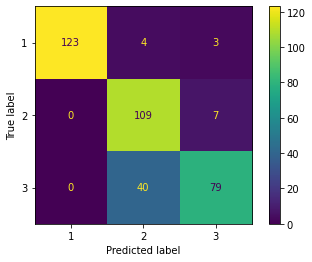

Accuracy Score is  0.852054794520548


In [97]:
y_pred = clf.predict(X_test)

print("Confusion Matrix for KNN")
plot_confusion_matrix(clf, X_test , y_test)
plt.show()
plt.close() 
knn_score= clf.score(X_test, y_test)
print("Accuracy Score is ", knn_score)

Confusion Matrix for xgb


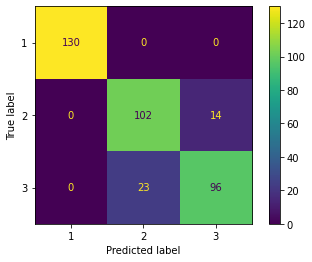

Accuracy Score is  0.8986301369863013


In [98]:
y_pred = xgb.predict(X_test)

print("Confusion Matrix for xgb")
plot_confusion_matrix( xgb, X_test , y_test)
plt.show()
plt.close() 
xgb_score= xgb.score(X_test, y_test)
print("Accuracy Score is ", xgb_score)